# Reading chains

Written by Andrew Li | June 2024

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import emcee
import corner

from collections import OrderedDict

AAU will be used as an example. If `aau_tutorial.ipynb` is ran in this folder, this code should run.

The following cells will generate the parameter labels (i.e. which parameter each dimension of the chain corresponds to). Edit the next cell depending on the model for the stream used.

In [2]:
# number of stream components
ns = 1

# number of background components
nbg = 1

In [3]:
def generate_labels(streams,bgs):
    labels = ['pstream']
    for i in range(streams-1):
        labels += ['pstream_' + str(i+1)]
    for i in range(bgs-1):
        labels += ['pbg' + str(i+1)]
    labels += ["v1","v2","v3","lsigv",
                "feh1","lsigfeh",
                "pmra1","pmra2","pmra3","lsigpmra",
                "pmdec1","pmdec2","pmdec3","lsigpmdec",]
    for i in range(streams-1):
        labels += ["v1_" + str(i+2),"v2_" + str(i+2),"v3_" + str(i+2),"lsigv_" + str(i+2),
                "feh1_" + str(i+2),"lsigfeh_" + str(i+2),
                "pmra1_" + str(i+2),"pmra2_" + str(i+2),"pmra3_" + str(i+2),"lsigpmra_" + str(i+2),
                "pmdec1_" + str(i+2),"pmdec2_" + str(i+2),"pmdec3_" + str(i+2),"lsigpmdec_" + str(i+2)]
    labels += ["bv", "lsigbv", "bfeh", "lsigbfeh", "bpmra", "lsigbpmra", "bpmdec", "lsigbpmdec"]
    for i in range(bgs-1):
        labels += ["bv_" + str(i+2), "lsigbv_" + str(i+2), "bfeh_" + str(i+2), "lsigbfeh_" + str(i+2),
                   "bpmra_" + str(i+2), "lsigbpmra_" + str(i+2), "bpmdec_" + str(i+2), "lsigbpmdec_" + str(i+2)]
    return labels

In [4]:
param_labels = generate_labels(ns,nbg)

Chains are stored as `.h5` files, which can be read with `emcee` to become 3-d arrays (nstep, nwalkers, nparams). Edit the filename in the next cell.

In [5]:
reader = emcee.backends.HDFBackend("aau_chains.h5", read_only=True)
chain = reader.get_chain()

In [6]:
nstep, nwalkers, nparams = chain.shape

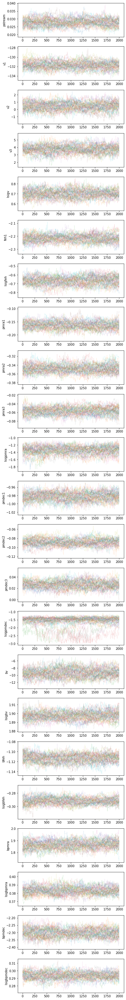

In [7]:
fig, axes = plt.subplots(nparams, figsize=(6,2*nparams))
for iparam,ax in enumerate(axes):
    for j in range(nwalkers):
        ax.plot(chain[:,j,iparam], lw=.5, alpha=.2)
        ax.set_ylabel(param_labels[iparam])
fig.tight_layout()

In [8]:
flatchain = chain.reshape(nstep*nwalkers,nparams)

From this point on, these cells are found in the `aau_tutorial.ipynb` notebook. `chain` is (nwalkers, nstep, nparams) instead when read directly from `emcee.EnsembleSampler`, so be cautious when using that.

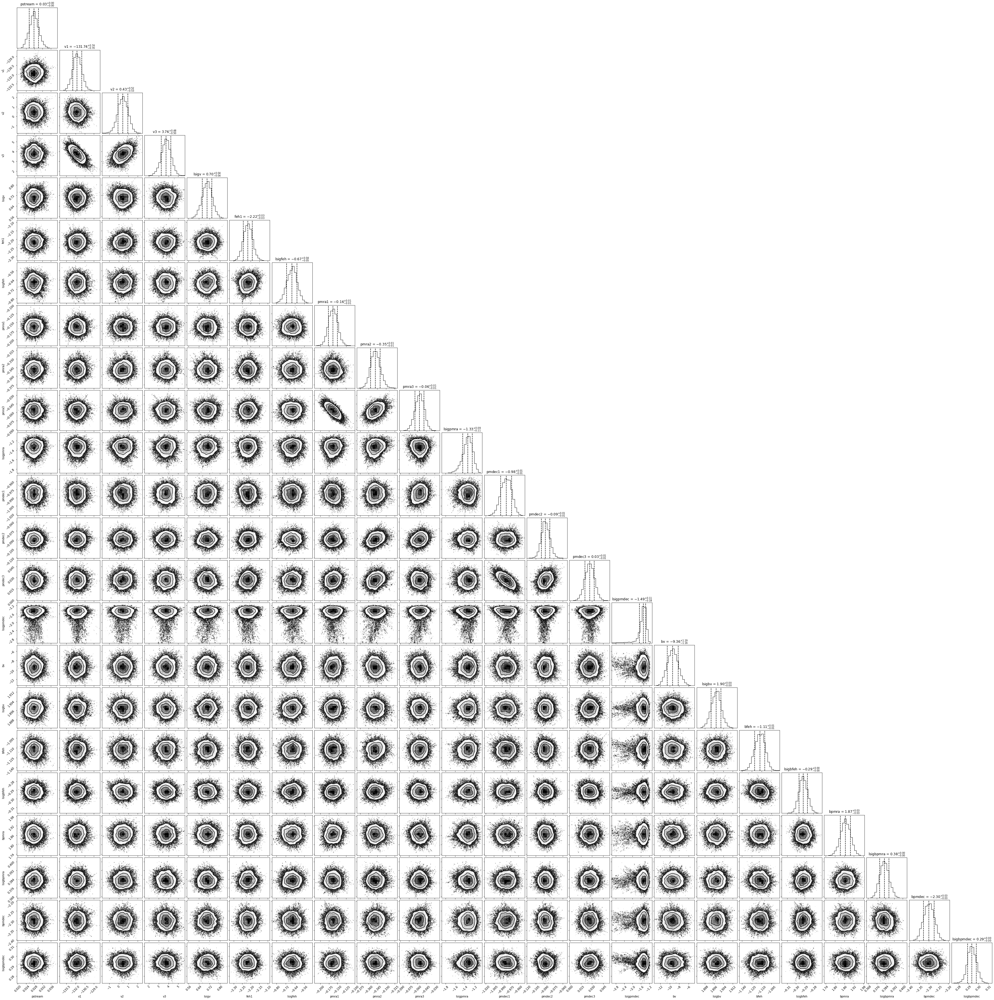

In [9]:
fig = corner.corner(flatchain, labels=param_labels, quantiles=[0.16,0.50,0.84], show_titles=True)

In [10]:
def process_chain(chain, avg_error=True):
    ''' Returns the means and errors of teh parameters
    
    Parameters:
    chain - array. The chain
    avg_error - bool. Will average the + and - errors if True
    
    Return:
    2 or 3 OrderedDict as a tuple. means, errors or means, errors+, errors-
    '''
    pctl = np.percentile(chain, [16, 50, 84], axis=0)
    meds = pctl[1]
    ep = pctl[2]-pctl[1]
    em = pctl[0]-pctl[1]
    if avg_error: # just for simplicity, assuming no asymmetry
        err = (ep-em)/2
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, err))
    else:
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, ep)), OrderedDict(zip(param_labels, em))

In [11]:
meds, errs = process_chain(flatchain)

In [12]:
i = 0
for k,v in meds.items():
    if k[0] == 'l':
        print("{} {:.3f} {:.3f}".format(k[1:], 10**v, np.log(10)*(10**v)*errs[k]))
    else:
        print("{} {:.3f} {:.3f}".format(k, v, errs[k]))
    i += 1

pstream 0.028 0.002
v1 -131.742 0.722
v2 0.435 0.526
v3 3.762 0.491
sigv 5.029 0.432
feh1 -2.217 0.026
sigfeh 0.216 0.022
pmra1 -0.163 0.013
pmra2 -0.349 0.008
pmra3 -0.056 0.008
sigpmra 0.046 0.011
pmdec1 -0.982 0.010
pmdec2 -0.089 0.007
pmdec3 0.027 0.006
sigpmdec 0.033 0.011
bv -9.360 1.172
sigbv 79.012 0.778
bfeh -1.113 0.008
sigbfeh 0.511 0.006
bpmra 1.866 0.032
sigbpmra 2.415 0.024
bpmdec -2.300 0.028
sigbpmdec 1.965 0.020


In [17]:
def quad_f(phi,c1,c2,c3):
    x = phi/10
    return c1 + c2*x + c3*x**2

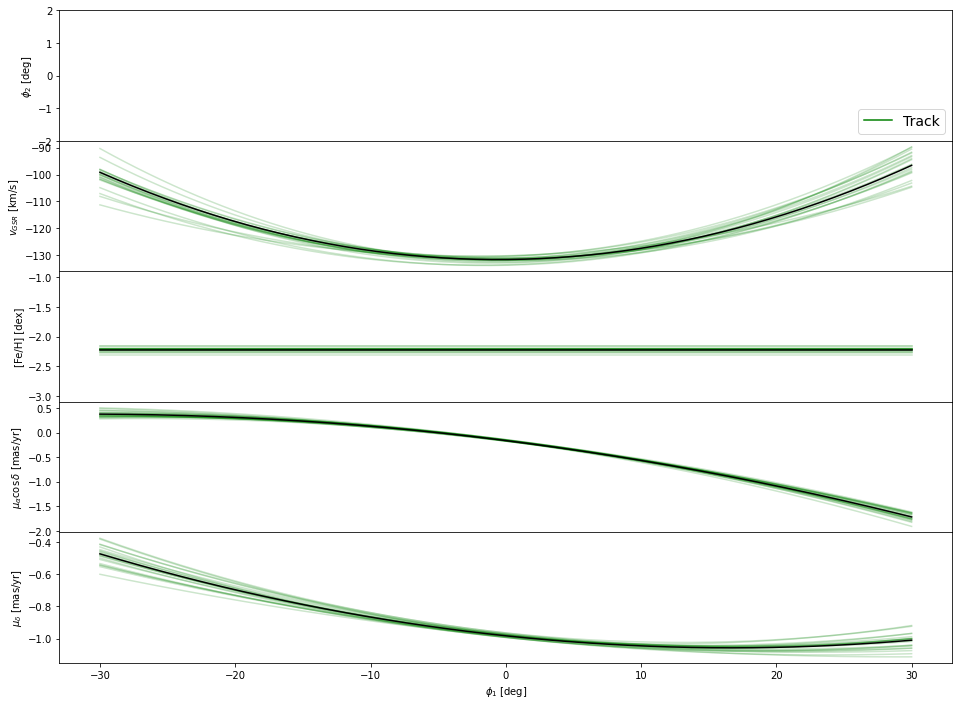

In [16]:
fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

x_arr = np.linspace(-30,30,200)

for i in range(20):
    ax[1].plot(x_arr,quad_f(x_arr,
                            np.random.choice(flatchain[:,param_labels.index('v1')]),
                            np.random.choice(flatchain[:,param_labels.index('v2')]),
                            np.random.choice(flatchain[:,param_labels.index('v3')])),
               color='g',alpha=0.2)
    ax[2].plot(x_arr,np.random.choice(flatchain[:,param_labels.index('feh1')])*np.ones(200),
               color='g',alpha=0.2)
    ax[3].plot(x_arr,quad_f(x_arr,
                            np.random.choice(flatchain[:,param_labels.index('pmra1')]),
                            np.random.choice(flatchain[:,param_labels.index('pmra2')]),
                            np.random.choice(flatchain[:,param_labels.index('pmra3')])),
               color='g',alpha=0.2)
    ax[4].plot(x_arr,quad_f(x_arr,
                            np.random.choice(flatchain[:,param_labels.index('pmdec1')]),
                            np.random.choice(flatchain[:,param_labels.index('pmdec2')]),
                            np.random.choice(flatchain[:,param_labels.index('pmdec3')])),
               color='g',alpha=0.2)

ax[1].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k')
ax[2].plot(x_arr,meds['feh1']*np.ones(200),color='k')
ax[3].plot(x_arr,quad_f(x_arr,meds['pmra1'],meds['pmra2'],meds['pmra3']),color='k')
ax[4].plot(x_arr,quad_f(x_arr,meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),color='k')

ax[0].plot(x_arr,10*np.ones(len(x_arr)),color='g',label='Track')
    


ax[0].set(ylabel='$\phi_2$ [deg]',ylim=(-2,2))
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]')
ax[2].set(ylabel=r'[Fe/H] [dex]',ylim=(-3.1,-0.9))
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]')
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]')
plt.subplots_adjust(hspace=0)

ax[0].legend(ncol=4,loc=4,prop={'size':14})

Text(0.5, 0, 'feh')

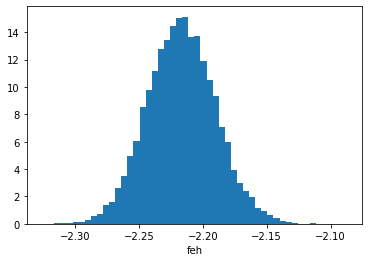

In [41]:
plt.hist(flatchain[:,5],density=True,bins=50)
plt.xlabel('feh')